<a href="https://colab.research.google.com/github/Sayed-Husain/Image-Classification-Projects/blob/main/Dog%20Vision/DogVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification 🐶


## About this project



This notebook bulids an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

### 1. Problem

Identifying the breed of of a dog.

By taking a photo of a dog, using this model, we would be able to know what breed of dog it is.

### 2. Data

The data we are using is from [Kaggle's dog breed identification competetion](https://www.kaggle.com/competitions/dog-breed-identification/data). 

### 3. Evaluation

The Evaluation is a file with prediction probabilities for each dog breed of each test image. [Link](https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation)

### 4. Features

Some information about the data:
* We are dealing with images (unstructured data), therefore, we will be using deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in teh test set (these images have no labels as we are trying to predict them).

## First of all, mount google drive (give google collab access to google drive).

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
# Unzip the uploaded data into Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

## Get Our Workspace ready

* Import TensorFlow 2.x. ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import TensorFlow 2.X. into Google Collab
import tensorflow as tf 
print("TF version:", tf.__version__)

# Import Tensorflow Hub
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

# Check for GPU availability 
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available


## Getting our data ready (turning data into tensors)

As for all machine learning models, the data has to be in numerical format. So the first thing we have to do is turning our images into Tensors (numerical representation).

Let's start by accessing pur data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


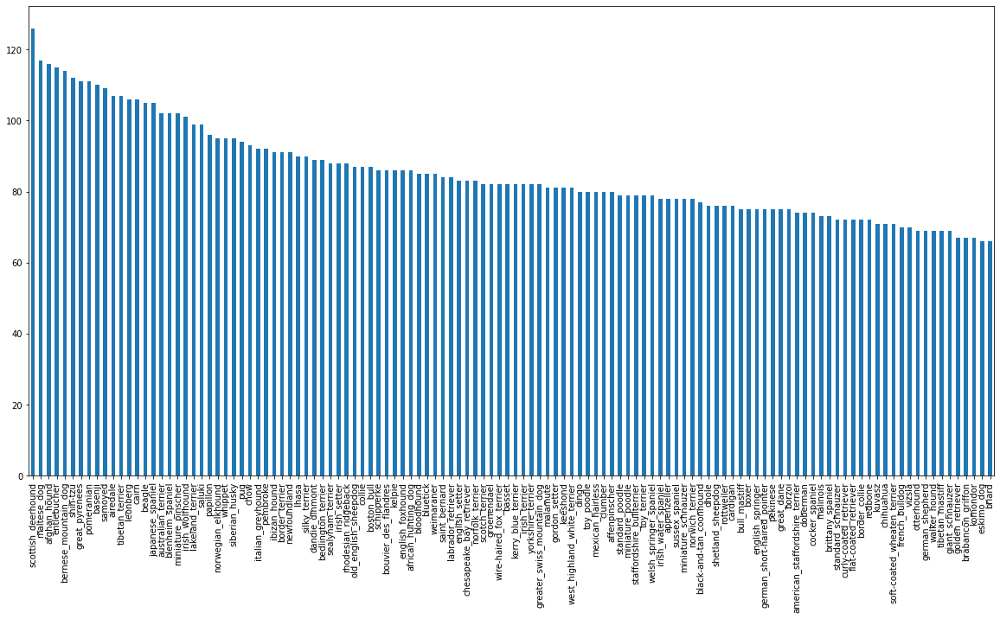

In [ ]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
print("The mean number of images per breed = " , labels_csv["breed"].value_counts().mean())
print("The median number of images per breed = " , labels_csv["breed"].value_counts().median())

The mean number of images per breed =  85.18333333333334
The median number of images per breed =  82.0


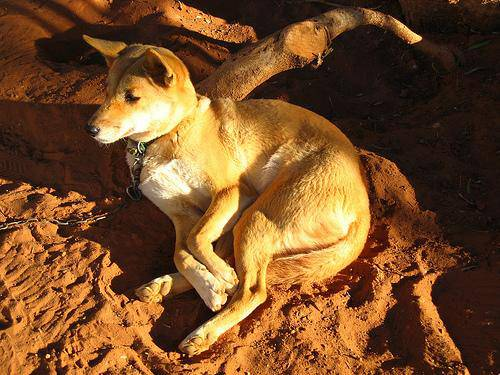

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their labels
Let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's

filenames = ["drive/MyDrive/Dog Vision/train/" + fname +".jpg" for fname in labels_csv["id"]]

# Check for the first 10 filenames
filenames[0:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os 
if len(os.listdir("drive/MyDrive/Dog Vision/train/"))  == len(filenames):
  print("Success: The number of files in the filenames list matches with the number of files in the target directory.")
else:
  print("Error: The number of files in the filenames list DOES NOT matche with the number of files in the target directory.")

Success: The number of files in the filenames list matches with the number of files in the target directory.


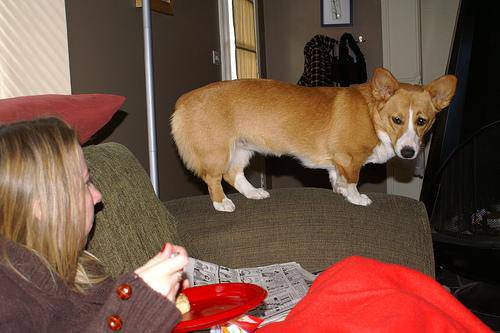

In [ ]:
# Check whether the filenames list is working properly
Image(filenames[10000])

At this point, we have got the training data (images) filepaths in a list, it is time to prepare the labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans (only the index of the coreect breed will return True)
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array 
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample labels occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
As Kaggle's dataset is missing a validation set, we are going to create our own

In [ ]:
# Setup X, y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We are going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split into training and validation sets based on the size of NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we are going to write a function which does the preprocessing.

Howeber before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Turn an image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now we have seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a varible, `image`
3. Turn our `image` (a jpg) to Tensors
4. Normalize our image (convert color channels values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified the `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Gree, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... tehy all might not fit into memory.

So that's why we do about 32 (this is batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: 
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Take an image file path name and the assosiated label, processes the image and return a tupel of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
get_image_label(X[42],y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have managed to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data  (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shfulle if it's validation data.
  Also accepts test data as inputs  (no labels).
  """

  # If the data is a test dataset, we know we do not have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch =data.batch(batch_size)
    
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visulazing Data Batches

Our data is now in batches, in order to make it more understandable/comprehendable, let's visulazie them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images (images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15,15))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as teh title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


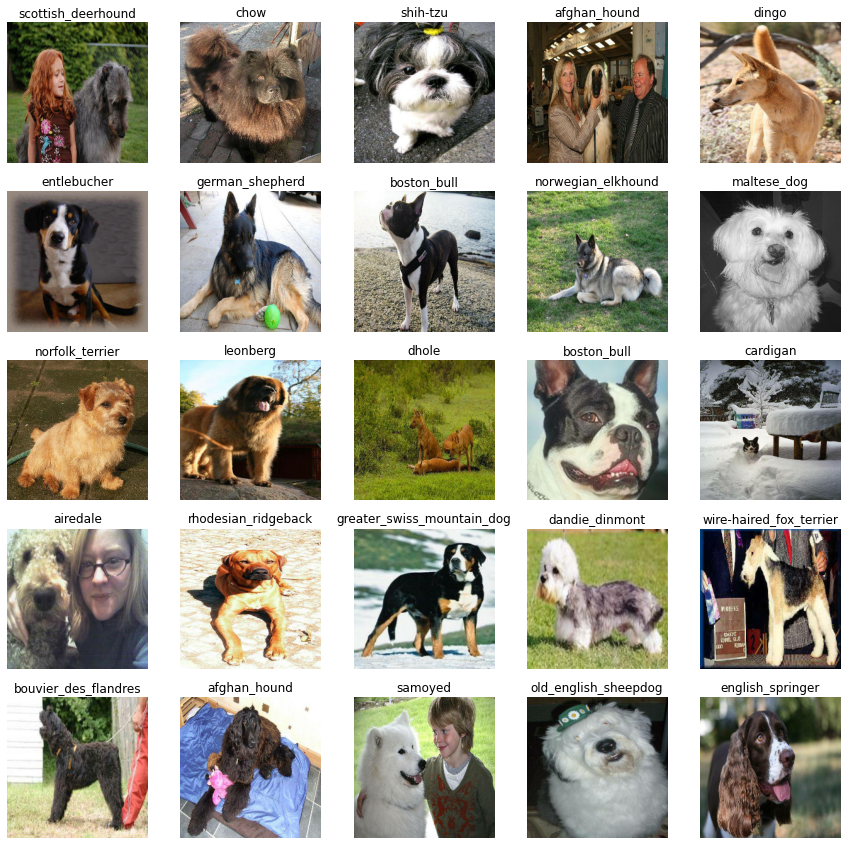

In [ ]:
# Unbatch train_Data
train_images, train_labels = next(train_data.as_numpy_iterator())

# Now let's vizulaize the data in a training batch
show_25_images(train_images, train_labels)

## Buliding a model
Before we bulid a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use from [TensorFlow Hub](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5)

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now as we have our inputs, outputs, and model ready to go. We are ready to puth them all together into a Keras deep learning model!

Knowing this, let's create a function which: 
* Takes the input shape, output shapeand the model we have chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (linear process).
* Comiles the model (says it should be evaluated and improved)
* Bulids the model (tells the model the input shape it will be getting).
Returns the model


In [ ]:
# Create a function which bulids a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url= MODEL_URL):
  """
  Setup the layers based on TensorFlow Hub, Compiles the model using CategoricalCrossentropy for loss, Adam for optimizing, and accuracy as metric, and finally bulid the model and return it.
  """
  
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
          hub.KerasLayer(model_url), # Layer 1 (input layer)
          tf.keras.layers.Dense(units = output_shape,
                                activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model 
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )  

  # Bulid the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress,check its progress or stop training early if a model stops improving.

We will create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.


### TensorBoard Callback

To setup a tensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension. ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visulaize our models training logs with the `%tensorboard` magic function (after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to bulid a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

[Link](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure that we are still running on a GPU
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available


Let's create a function which trains a model.

* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks functions we would like to use.
* Return the model

In [ ]:
# Bulid a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 133s 4s/step - loss: 4.7143 - accuracy: 0.0913 - val_loss: 3.6774 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 4s 156ms/step - loss: 1.7156 - accuracy: 0.6600 - val_loss: 2.3242 - val_accuracy: 0.4450
Epoch 3/100
25/25 [==============================] - 3s 134ms/step - loss: 0.5902 - accuracy: 0.9425 - val_loss: 1.7895 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 3s 134ms/step - loss: 0.2648 - accuracy: 0.9825 - val_loss: 1.6297 - val_accuracy: 0.5650
Epoch 5/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1518 - accuracy: 0.9962 - val_loss: 1.5428 - val_accuracy: 0.5850
Epoch 6/100
25/25 [==============================] - 4s 159ms/step - loss: 0.1031 - accuracy: 1.0000 - val_loss: 1.4867 - val_accuracy: 0.5800
Epoch 7/100
25/25 [==============================]

**Question:** It looks like our model is overfitting because it's performing far better in the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural network?

**Note:** Overfitting in this case is not nessesary a bad thing as it is an indicator that the model is actually able to learn.

### Checking the TensorBoard logs

The TensorBoard magic function (`tensorboard`) will access the logs directory we created eariler and visualize its content.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 115ms/step


array([[7.9024880e-04, 5.2700940e-05, 8.4396731e-04, ..., 3.4458778e-04,
        1.8576746e-05, 3.1844676e-03],
       [8.1934268e-04, 2.9593569e-04, 2.1185588e-02, ..., 1.6420102e-04,
        2.8860435e-04, 1.7627591e-04],
       [7.6443696e-04, 6.0445618e-05, 8.9513930e-04, ..., 4.2506988e-05,
        4.0466432e-04, 6.5657322e-04],
       ...,
       [6.0707312e-06, 6.0914231e-06, 3.7550275e-05, ..., 1.4401886e-05,
        4.0171202e-05, 4.4317167e-05],
       [1.2415455e-02, 1.2722109e-04, 7.3013740e-05, ..., 5.9852935e-04,
        1.3209686e-04, 3.6520500e-02],
       [1.2000350e-03, 8.4213107e-06, 1.4660879e-04, ..., 4.7289715e-03,
        2.7832086e-04, 4.5058128e-05]], dtype=float32)

In [ ]:
# First Prediciton
index = 42
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.55259282e-05 7.23701451e-05 4.68230137e-05 2.26558459e-05
 1.09853386e-03 6.23599317e-06 9.03934342e-05 3.67207307e-04
 2.87858699e-03 1.17359236e-02 5.56867017e-05 1.32004584e-06
 1.89614409e-04 3.66655807e-03 6.17515296e-04 1.19638105e-03
 2.29202597e-05 1.46639941e-04 8.57931300e-05 2.35189204e-04
 2.16681237e-05 5.02570998e-04 9.79536435e-06 2.87238909e-05
 3.34102241e-03 2.14247018e-04 1.57372779e-05 5.53681239e-05
 1.35790353e-04 5.61263987e-05 1.26546758e-04 3.44613072e-05
 1.77530055e-05 2.15236068e-05 1.63854020e-05 1.36087674e-05
 2.05770324e-04 2.77547253e-04 3.54972253e-05 9.01304260e-02
 7.10419627e-05 6.49549793e-06 2.27831071e-03 2.86566251e-06
 4.67167265e-04 1.41055007e-05 4.66838799e-04 4.30361310e-04
 6.05570540e-06 1.72028071e-04 9.68315217e-05 1.84195742e-04
 5.85887698e-04 3.00648273e-03 8.04572210e-06 2.64268514e-04
 6.22339503e-05 5.43103124e-05 7.16227078e-05 6.75730626e-05
 4.48564788e-05 3.32876487e-04 2.24063588e-05 3.88960179e-05
 4.69358565e-05 1.617691

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see teh image the prediction is being made on! 

**Note:** Prediction probablities are also known as confidence levels.

In [ ]:
# Turn predictions probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


Now since our validation data is still in a batch dataset, we will have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels.

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset  
def unbatch(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(get_pred_label(label))
  return images, labels

# Unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels
* Validation images

It is time to make some functions to make all a bit more visulaize

We will create a function `plot_pred()`which:
* Takes an array of predection probabilities, an array of truth labels, and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predictied probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilites, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilites[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Adjust String
  pred_label = pred_label.replace("_"," ").capitalize()
  true_label = true_label.replace("_"," ").capitalize()

  # Change the colour of the title dependign on whether the prediction is correct or not.
  if pred_label == true_label:
    color = "green"
    plt.title(f"Predicted {pred_label} with {np.max(pred_prob)*100:2.0f}% Confidence", color=color)
  else:
    color = "red"
    plt.title(f"Mistook {true_label} for {pred_label} with {np.max(pred_prob)*100:2.0f}% Confidence", color=color)


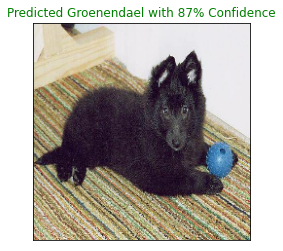

In [ ]:
plot_pred(predictions, val_labels, val_images, n=77)

Now we have got `plot_pred()` function to visulaize our models top prediction, let's make a `plot_pred_conf()` function to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilites array and ground truth array and an integer: ✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilites indexes ✅
  * Prediction probabilites values ✅
  * Prediction labels
* Plot the top 10 prediction probability values and labels coloring the true label green. ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get all the predictied labels
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 predictions confidence values (the confedince/probabilities)
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels 
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), # The X value. Also = 10
                     top_10_pred_values, # The Y value
                     color="grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)), # Also = 10
             labels=top_10_pred_labels, # The name of the predicted breed
             rotation="vertical") # Make rotation vertical to avoid the names from colliding
  
  # Change the color of bar represnting the true label to Green
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green") # Only select the true label to change color
  else:
    pass # Keep wrong predictions grey

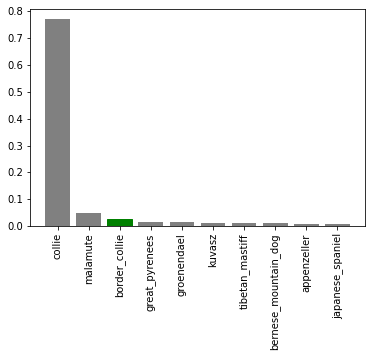

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

Now as we got some functions to help us visualize our predictions and evaluate our model, let's check out some predictions.

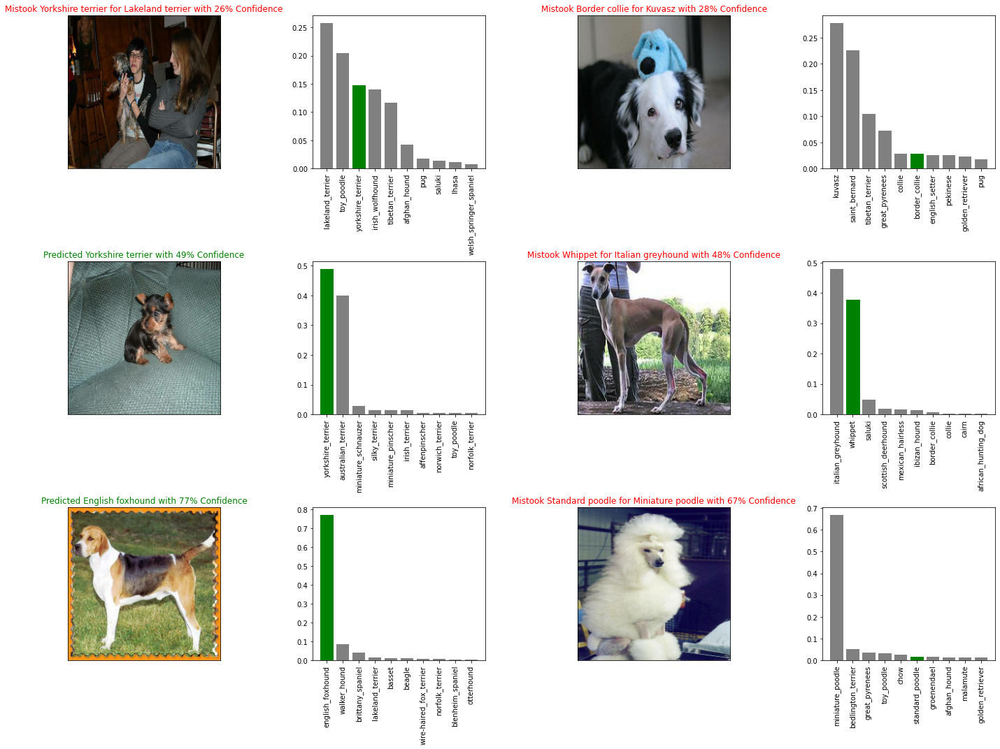

In [ ]:
# Let's check out a few predictions and their different values
# Let's combine the two visualizing functions

i_multiplier = 10 #@param{type:"slider", min:1, max:100, step:1} 
# Will change which predictions to visualaize

num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()



TODO: Make a confusion matric with our models predictions and true label.

## Saving and Reloading a trained model 

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%D-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # h5 is the extension of the saved model
  print(f"Saving model to: {model_path}...") 
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})

  return model

As we have functions to save and load model, let's make sure that they work!

`save_model()` ✅

`load_model()` ✅

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220808/04/22-03381659584293-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220808/04/22-03381659584293-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20220808/04/22-03381659584293-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20220808/04/22-03381659584293-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Confirm the loaded model by comparing it to the original model
if model.evaluate(val_data) == loaded_1000_image_model.evaluate(val_data):
  print("Confirmed")
else:
  print("Could not confirm")

7/7 [==============================] - 1s 121ms/step - loss: 1.3645 - accuracy: 0.6150
Confirmed


## Training the dog model 🐶 model of the full dataset

In [ ]:
# Original Train data length
len(X), len(y)

(10222, 10222)

In [ ]:
# The data we used to trian the model
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Create a data batch with the fill data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for the full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


**Note:** Running the cell below will take a while because the GPU we are using in the runtime has to laod all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 119ms/step - loss: 1.3489 - accuracy: 0.6715
Epoch 2/100
320/320 [==============================] - 38s 118ms/step - loss: 0.4010 - accuracy: 0.8806
Epoch 3/100
320/320 [==============================] - 43s 134ms/step - loss: 0.2379 - accuracy: 0.9331
Epoch 4/100
320/320 [==============================] - 61s 190ms/step - loss: 0.1533 - accuracy: 0.9645
Epoch 5/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1053 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0772 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0591 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0454 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0374 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 45s 141m

In [ ]:
# Save the full model 
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220808/04/22-04271659587278-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220808/04/22-04271659587278-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20220808/04/22-04271659587278-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20220808/04/22-04271659587278-full-image-set-mobilenetv2-Adam.h5


## Making predictinos on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we will have to get it to the same format.

In this case, we can use the function that created eariler `create_data_batches` to take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we have to:
* Get the test image filenames(paths) ✅
* Convert the filenames into test data batches using `create_data_batches` and setting the `test_data` parameter to `True` (as the test data has no labels) ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image dilename
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e1e6d180a31b0a9c0d741d0f142ea6af.jpg',
 'drive/MyDrive/Dog Vision/test/de084b830010b6107215fef5d4a75b94.jpg',
 'drive/MyDrive/Dog Vision/test/ddc0134def0da0472e55271da8b57c44.jpg',
 'drive/MyDrive/Dog Vision/test/e2c7aeef019a6577f3988a84be2b5769.jpg',
 'drive/MyDrive/Dog Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/MyDrive/Dog Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/Dog Vision/test/dfdeddf3da8d52c211620eaabd82b773.jpg',
 'drive/MyDrive/Dog Vision/test/e36ec4ab8218060660ec82fd6c4757a7.jpg',
 'drive/MyDrive/Dog Vision/test/e18fbb12037c297b90642e99073cd6b4.jpg',
 'drive/MyDrive/Dog Vision/test/e6999e18a8e98f7fc33cf520d26ec521.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


**Note:** Calling `predict()` on our full model and passing it the test batch will take a long time to run.

In [ ]:
# Make predictions on test data batch using loaded full model
test_prediction = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 176s 526ms/step


In [ ]:
# Save predictions (NumPy array) to scv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_prediction, delimiter=",")

In [ ]:
loaded_test_preds = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
loaded_test_preds[:10]

array([[1.14331038e-12, 1.02079810e-10, 2.79469503e-12, ...,
        2.24055530e-09, 3.50591070e-14, 1.41544597e-11],
       [1.26061954e-12, 7.33176151e-08, 2.69118572e-09, ...,
        1.13301848e-08, 3.18804899e-10, 9.07838935e-14],
       [1.70072553e-10, 1.53144526e-06, 2.85245216e-10, ...,
        3.49464329e-07, 1.35349489e-06, 6.87953294e-09],
       ...,
       [3.50034390e-10, 3.54192792e-07, 1.91682351e-10, ...,
        9.60037383e-08, 3.32238699e-07, 3.46218443e-10],
       [1.09876659e-08, 1.06836417e-09, 9.73863656e-09, ...,
        6.66463273e-10, 6.93621473e-07, 4.95740436e-02],
       [9.89906257e-05, 2.05041658e-07, 3.34189139e-07, ...,
        1.78228929e-05, 4.29998763e-05, 5.21617358e-06]])

In [ ]:
loaded_test_preds.shape

(10357, 120)

## Prepare the test dataset predictions file for Kaggle's submission

Looking at the Kaggle sample submission, we find that it wants our models predicions probability outputs in a DataFrame (csv) with and ID and a column for eaxh different dog breed. 

To get the data in this format, we will:
* Create a pandas DataFrame with and ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths. ✅
* Add data (the predicted probabilites to each of the dog breed columns. ✅
* Export the DataFrame as a CSV to submit it to Kaggle. ✅

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_IDs = [os.path.splitext(path)[0] for path in os.listdir(test_path)] # Will return only the IDs from the test dir
preds_df["id"] = test_IDs

In [ ]:
# Add the prediction probabilities to each dog breed columns
preds_df[list(unique_breeds)] = loaded_test_preds
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1e6d180a31b0a9c0d741d0f142ea6af,1.143310e-12,1.020798e-10,2.794695e-12,2.339840e-11,8.627227e-10,7.143715e-10,7.276491e-13,1.000460e-11,6.623896e-12,...,2.337899e-11,3.359942e-11,3.542932e-13,2.675839e-10,1.925330e-12,4.476244e-07,5.193358e-12,2.240555e-09,3.505911e-14,1.415446e-11
1,de084b830010b6107215fef5d4a75b94,1.260620e-12,7.331762e-08,2.691186e-09,1.387963e-07,1.640943e-13,3.764310e-09,6.270174e-11,2.383592e-11,2.095518e-12,...,1.778710e-14,3.202081e-12,2.677336e-13,1.098165e-09,3.989017e-08,1.807983e-13,1.953981e-11,1.133018e-08,3.188049e-10,9.078389e-14
2,ddc0134def0da0472e55271da8b57c44,1.700726e-10,1.531445e-06,2.852452e-10,1.318261e-09,3.218274e-11,2.945615e-11,2.280981e-10,2.782150e-09,1.330298e-12,...,3.193654e-08,1.184635e-10,5.036136e-11,3.179257e-11,4.519506e-11,1.122098e-09,5.272055e-09,3.494643e-07,1.353495e-06,6.879533e-09
3,e2c7aeef019a6577f3988a84be2b5769,2.489076e-12,7.424915e-16,2.407633e-11,1.241327e-13,1.346414e-05,7.455206e-10,3.467011e-11,3.331557e-07,5.837948e-13,...,7.837739e-09,9.995508e-01,3.621088e-11,1.636617e-11,6.027860e-10,1.919342e-15,5.981372e-10,1.432054e-10,1.201548e-13,1.793342e-07
4,e7afcce6e45858fc3b294cc5c0b15a53,5.014371e-01,2.147370e-08,1.357504e-09,5.004888e-10,3.377480e-09,5.336794e-12,6.655802e-07,1.356323e-11,3.216594e-12,...,3.023376e-07,1.364873e-08,2.294574e-08,3.339921e-09,6.597637e-10,2.636021e-11,1.079276e-11,1.504324e-09,4.671672e-08,5.550724e-07


In [ ]:
# Export our predictions DataFrame to CSV for Kaggle's submission
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we will:
* Get the filepath of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images will not have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method. 
Convert teh prediction output probabilities to prediction label.
* Compare the predicted labels to teh custom images.

In [ ]:
# Get custom folder path
custom_path = "drive/MyDrive/Dog Vision/custom/"

In [ ]:
def custom_img_pred(path=custom_path):
  # Get custom images filepath
  custom_images_paths = [custom_path + fname for fname in os.listdir(custom_path)]

  # Turn custom images into batch datasets
  custom_data = create_data_batches(custom_images_paths, test_data=True)

  # Make predictions on the custom data
  custom_preds = loaded_full_model.predict(custom_data)

  # Get custom image prediction labels
  custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

  # Get custom images
  custom_images = []

  # Loop through unbatched data
  for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

  # Add line space
  print("Showing Predictions\n")

  # Check custome image predictions
  plt.figure(figsize=(10,10))
  for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i+1) # rows, columns, index
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image);


Creating test data batches...
Showing Predictions



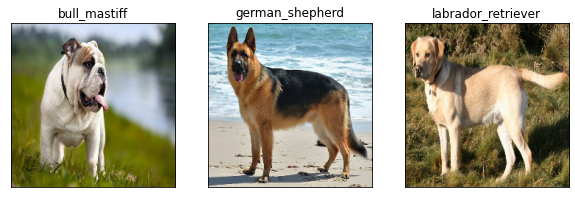

In [ ]:
custom_img_pred()